# 1. Siapkan foto model objek (dataset)

Untuk membuat dokumen paket *object detection* ada beberapa hal yang harus di siapkan terlebih dahulu, yaitu diantaranya adalah seperti dibawah.

1.   siapkan gambar models yang akan dideteksi nantinya. dalam menyiapkan gambar ini akan lebih baik jika gambar tidak identik dari segi posisi objek dalam gambar, pencahayaan, kualitas dan yang lainnya. beberapa hal tersebut akan mempengaruhi kemampuan *object detection* nantinya. Siapkan minimal 200 gambar berbeda untuk diproses nanti, lebih banyak lebih baik. Perlu diingat juga gambar yang bisa diproses hanya berupa extensi `.jpg` `.png` dan `.bmp` saja.
2.   Lakukan penlabelan kepada masing masih gambar yang sudah disiapkan pada tahap satu, menggunakan aplikasi label gambar (sebagai contoh jika menggunakan macos bisa memakai aplikasi [reactLabel](https://apps.apple.com/us/app/rectlabel/id1210181730?mt=12). cara penlabelan gambar bisa mengikuti video berikut [How to Capture and Label Training Data to Improve Object Detection Model Accuracy](https://www.youtube.com/watch?v=v0ssiOY6cfg)

Jika dua proses diatas sudah dilakukan maka setiap foto yang ada akan memiliki satu file .xml sebagai notasi dari setiap objek pada masing masing gambar, dan akan terlihat seperti berikut:

![folder_foto_model.png](https://raw.githubusercontent.com/DenisMrGnusa/object_detection_flutter_doc/main/image/folder_foto_model.png)



# 2. Upload dataset ke roboflow
Menggunakan bantuan website pelatihan AI roboflow untuk melakukan pelatihan terhadap dataset yang kita punya.


1.   Buka laman [https://app.roboflow.com/](https://app.roboflow.com/) dan login ke akun yang sudah ada, jika belum memiliki akun bisa melakukan pendaftaran dulu.
2.   ketika sudah login, masuk ke menu workspaces dan buat workspace yang ingin di buat.
3.   dalam workspace yang telah di buat, buat projek baru dengan menekan tombol 'Create New Project'.
4.   Setelah tombol di tekan maka akan muncul form projek baru, pilih 'Object Detection' pada pilihan Project Type, Masukan nama projek pada inputan 'Project Name', input objek apa yang di deteksi dengan mengisi input 'What are you detection?'. Misal bisa diisi dengan 'ktp', 'kartu', atau apapun. selanjutnya isi input 'Licence' untuk menentukan lisensi dari projek kita, bisa diisi secara default CC BY 4.0 atau isi dengan MIT untuk project open source. setelah semua inputan diisi, klik tombol 'Create Public Project' untuk membuat project.
5. Upload semau file gambar dan notasi gambar (file .xml) yang sudah disiapkan sebelumnya pada tahap pertama di atas. dan tunggu sampai proses upload selesai.
6. Setelah proses upload selesai, lanjutkan proses dengan menekan tombol 'Save and Continue'. Seketika setelah tombol diklik, maka akan muncul form untuk kita menentukan berapa banyak gambar yang akan dipilih (dalam persentase) untuk proses 'train', 'valid', dan 'test' ([Lanjut baca](https://blog.roboflow.com/train-test-split/)). Untuk mempermudah bisa mengikuti setingan default dengan mengisi train = 70%, valid = 20%, dan test 10%. Klik 'Continue' untuk melanjutkan, dan tunggu proses upload gambar tahap dua selesai.
7. Setelah proses upload gambar pada tahap dua selesai, selanjutnya adalah membuat versi Dataset dengan mengikuti step-by-step yang sudah ada. Untuk mempermudah bisa mengikuti default mengisian yang ada, yang pada tahap terakhir (tahap 5) klik tombol 'Create' untuk melanjutkan proses.
8. Setelah tahap 7 selesai, akam muncul tampilan yang menampilkan opsi untuk melatih model baru menggunakan dataset yang sudah kita buat di tahap 7. Klik tombol 'Train with Roboflow' (perlu di ingat, akun gratis pada roboflow hanya bisa melakukan 'train' 3 kali). Selanjutnya klik opsi pelatihan 'Fast' atau 'Accurate' (karna menggunakan akun gratis, maka hanya bisa memilik opsi fast). `Penting diingat proses ini boleh dilakukan boleh tidak`.
9. Pada laman 'Image Dataset' (menu version), klik tombol 'Export Dataset' dan pilih format `YOLO v5 PyTorch` dan di bawahnya seleksi opsi 'show download code'. klik 'Continue' untuk melanjutkan. tunggu proses zipping dan akan tampil seperti dibawah:
![folder_foto_model.png](https://raw.githubusercontent.com/DenisMrGnusa/object_detection_flutter_doc/main/image/your_download_code.png)
copy script pada tab Jupiter dan simpan untuk sementara.


# 3. Train Dataset (latih dataset)

link tutorial dari [Roboflow-Training-YOLOv5](https://colab.research.google.com/drive/1gDZ2xcTOgR39tGGs-EZ6i3RTs16wmzZQ)

3.1.   Install Dependencies
langkap pertama adalah install paket - paket yang dibutuhkan. Sebelum itu jangan lupa pilih runtime GPU pada menu runtime (Runtime --> Change Runtime Type --> Hardware accelerator --> T4 GPU)

3.2. clone yolov5 ke colab, dengan menjalankan command di bawah. (jika berhasil pada folder di samping kiri akan tampil folder `yolov5`)

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 16117, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 16117 (delta 9), reused 11 (delta 1), pack-reused 16089
Receiving objects: 100% (16117/16117), 14.86 MiB | 9.64 MiB/s, done.
Resolving deltas: 100% (11032/11032), done.
/content/yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


3.3 Install Kebutuhan yolov5, dengan menjalankan command di bawah.

In [2]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 11.6 MB/s eta 0:00:00
Setup complete. Using torch 2.1.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


3.4 Install Custom Dataset yang sudah kita buat sebelumnya di roboflow. dengan mengikuti tahap sebelumnya (tahap 2 tentang Upload dataset ke roboflow).

In [3]:
#follow the link below to get your download code from from Roboflow
%cd /content/yolov5


#timpa command di bawah ini dengan command yang didapat dari proses tahap dua.

#!pip install roboflow
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace("test-ai-xd92u").project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="hDfBwGj1ndqHooZ90h7L")
project = rf.workspace("test-ai-xd92u").project("ktp-dl94a")
dataset = project.version(1).download("yolov5")




/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.0 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Succ

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to KTP-1 in yolov5pytorch:: 100%|██████████| 400/400 [00:00<00:00, 6902.90it/s]


In [4]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- ktpbelakang
- ktpdepan
nc: 2
roboflow:
  license: MIT
  project: ktp-dl94a
  url: https://universe.roboflow.com/test-ai-xd92u/ktp-dl94a/dataset/1
  version: 1
  workspace: test-ai-xd92u
test: ../test/images
train: KTP-1/train/images
val: KTP-1/valid/images


In [5]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [7]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [8]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

Pastikan semua command diatas di jalankan sesuai irutan (jalankan command selanjutnya setelah command sebelumnya selesai).

Setelah dirasa tidak ada masalah dengan semua command di atas, lanjutkan dengan menjalankan command di bawah ini untuk melatih atau training data set yang telah kita tambahkan.

baca penjelasan berikut untuk mengetahui informasi parameter pada command di bawah https://colab.research.google.com/drive/1gDZ2xcTOgR39tGGs-EZ6i3RTs16wmzZQ#scrollTo=VUOiNLtMP5aG

In [9]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
2023-12-31 13:44:10.792498: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-31 13:44:10.792551: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-31 13:44:10.794449: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-31 13:44:12.285554: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/KTP-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanc

Kita bisa mengganti parameter `--epochs 100` pada command di atas untuk merubah berapa berapa banyak proses training yang main dilakukan.

Harus menjadi catatan bahwa semakin banyak nominal yang diinputkan pada parameter tersebut, semakin lama juga waktu yang dibutuhkan dan semakin banyak juga kuota GPU yang di perlukan sampai proses training selesai.

dalam beberapa kasus, terkadang proses akan terhenti dan gagal jika limit GPU yang disediakan oleh google colab telah mencapai limit.

Kegagalan pelatihan dan informasi matriks lainnya akan di dimpan di TensorBoard dengan membaca file yolov5s_results.txt (Jika tidak diberi nama, defaultnya adalah results.txt.).

Jalankan command di bawah untuk melihat hasil matriks tersebut.

In [10]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

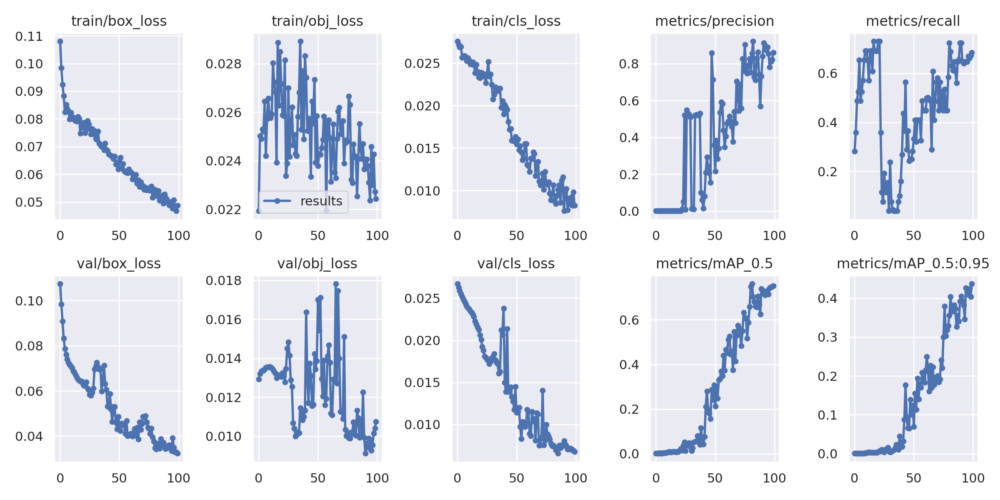

In [11]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

# 4. Cek hasil pelatihan
Lalukan pengecekan apakah object detection sudah bisa mengenali suatu objek pada gambar dengan menjalankan command di bawah.

GROUND TRUTH TRAINING DATA:


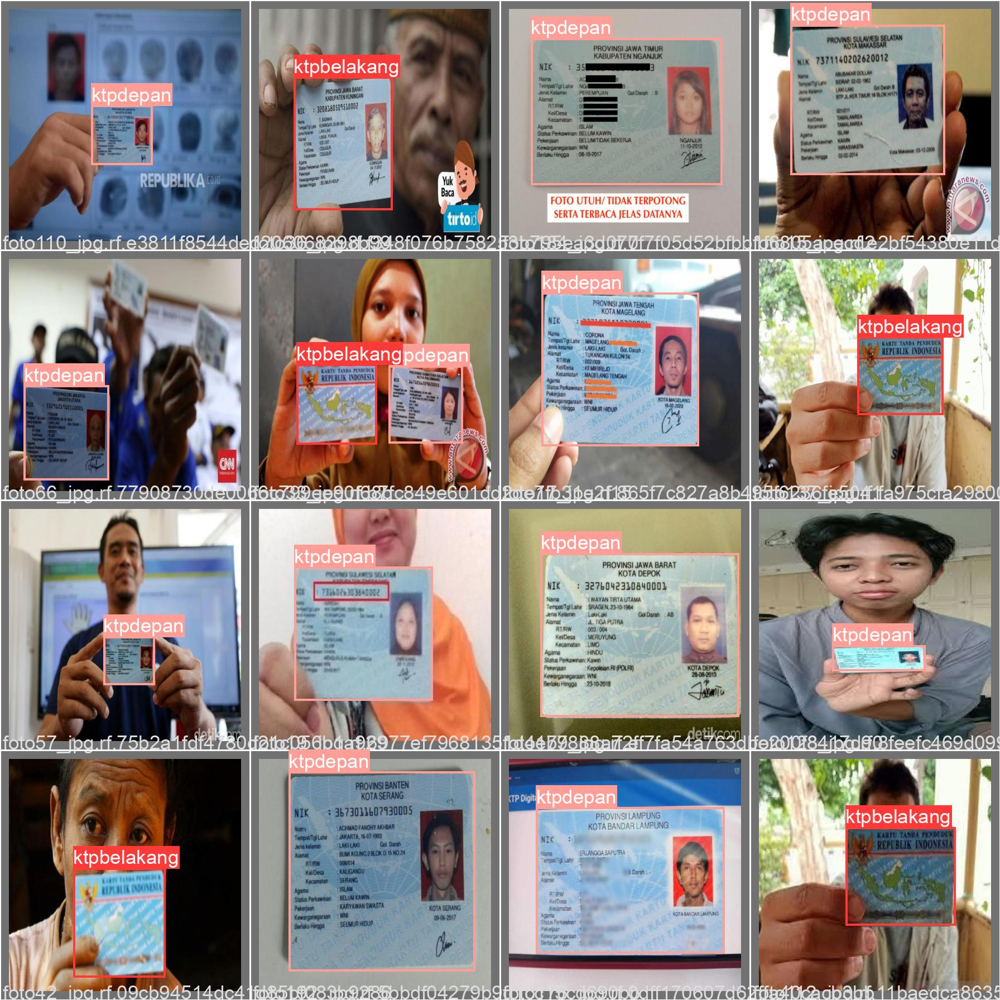

In [15]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


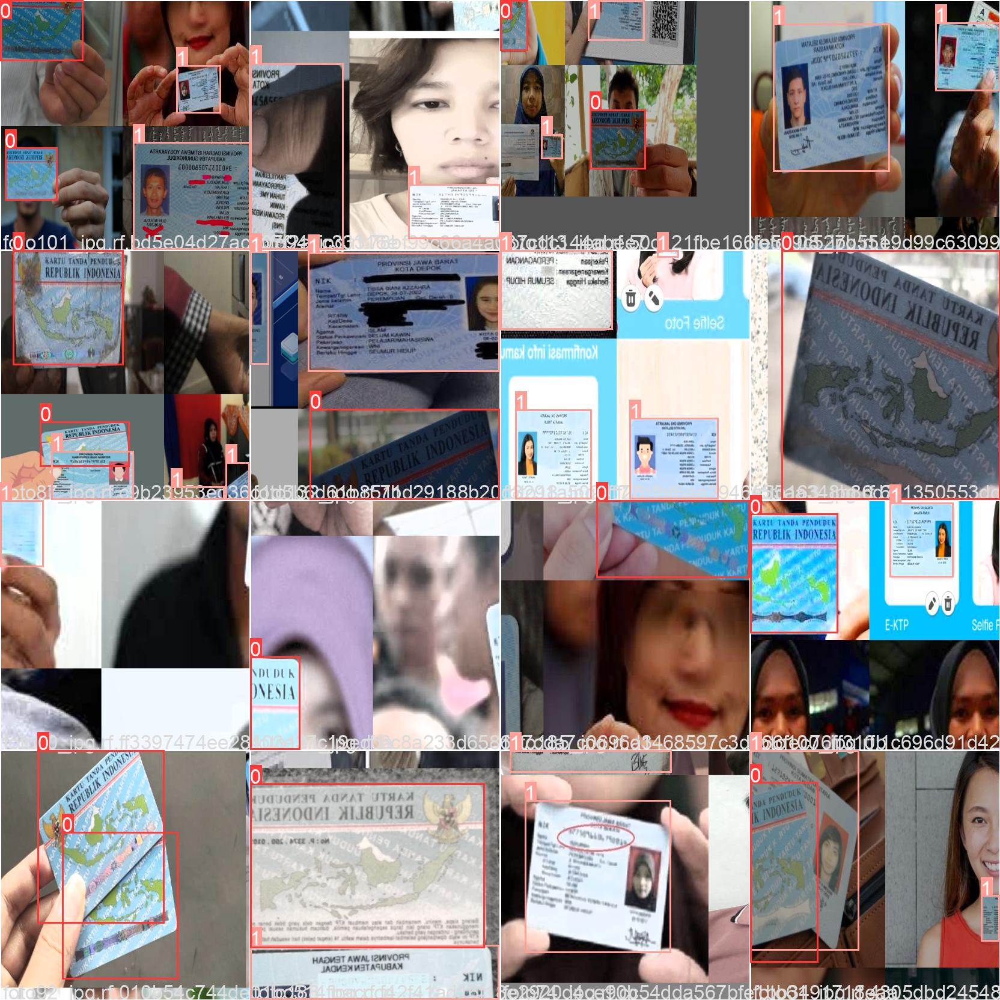

In [16]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

# 5. Download produk hasil training
Untuk dapat mendownload hasil dari pelatihan pada tahapan - tahapan di atas, jalankan command di bawah.

In [17]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [18]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [20]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
TEST_DIR = f'{dataset.location}/test/images'
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source {TEST_DIR}

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/KTP-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
image 1/20 /content/yolov5/KTP-1/test/images/foto105_jpg.rf.856ea7325b712081329e1e66946cf572.jpg: 416x416 Done. (0.008s)
image 2/20 /content/yolov5/KTP-1/test/images/foto138_jpg.rf.e0ff9faebf9fb8d11b76c5f7f98fa2b0.jpg: 416x416 1 ktpbelakang, Done. (0.008s)
image 3/20 /content/yolov5/KTP-1/test/images/foto140_

In [21]:
#display inference on ALL test images
#this looks much better with longer training above
import glob
from IPython.display import Image, display

%cd /content/yolov5/
for imageName in glob.glob('./inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

/content/yolov5


Tahap terakhir dari semua proses di atas adalah mendownload produk berupa file `.pt` untuk bisa digunakan di aplikasi flutter nantinya.

Jalankan command di bawah untuk mendownload file `.pt`.

In [22]:
from google.colab import files
files.download('./runs/train/yolov5s_results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Simpan file `best.pt` yang telah di download untuk bisa digunakan kembali nanti.

atau bisa mengkonversi file `best.pt` tersebut kedalam format machine learning lain seperti `.torchscript`, '.tflite' atau lainya dengan menjalankan command di bawah.

In [23]:
%cd /content/yolov5/

#download script yang dibutuhkan untuk konversi
!wget -L https://raw.githubusercontent.com/DenisMrGnusa/object_detection_flutter_doc/main/script/modified_export.py

/content/yolov5
--2023-12-31 14:17:24--  https://raw.githubusercontent.com/DenisMrGnusa/object_detection_flutter_doc/main/script/modified_export.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35440 (35K) [text/plain]
Saving to: ‘modified_export.py’

modified_export.py  100%[===================>]  34.61K  --.-KB/s    in 0.001s  

2023-12-31 14:17:24 (38.4 MB/s) - ‘modified_export.py’ saved [35440/35440]



In [31]:
%cd /content/yolov5/

!git pull https://github.com/ultralytics/yolov5

/content/yolov5
From https://github.com/ultralytics/yolov5
 * branch            HEAD       -> FETCH_HEAD
Updating fbe67e4..ba63208
Fast-forward
 utils/docker/.dockerignore => .dockerignore         |    2 +-
 .github/CODE_OF_CONDUCT.md                          |  128 ----
 .github/ISSUE_TEMPLATE/bug-report.yml               |    4 +-
 .github/ISSUE_TEMPLATE/config.yml                   |    9 +-
 .github/ISSUE_TEMPLATE/feature-request.yml          |    2 +-
 .github/PULL_REQUEST_TEMPLATE.md                    |    6 +-
 .github/README_cn.md                                |  291 --------
 .github/SECURITY.md                                 |    7 -
 .github/dependabot.yml                              |    6 +-
 .github/workflows/ci-testing.yml                    |  174 +++--
 .github/workflows/codeql-analysis.yml               |    9 +-
 .github/workflows/docker.yml                        |   22 +-
 .github/workflows/greetings.yml                     |   50 +-
 .github/workflows/links.ym

In [32]:
%cd /content/yolov5/

!python modified_export.py --weights ./runs/train/yolov5s_results/weights/best.pt --include torchscript coreml tflite

/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.2/663.2 kB 9.5 MB/s eta 0:00:00
modified_export: data=data/coco128.yaml, weights=['./runs/train/yolov5s_results/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'coreml', 'tflite']
YOLOv5 🚀 v7.0-254-gba63208 Python-3.10.12 torch-2.1.0+cu121 CPU

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients

PyTorch: starting from runs/train/yolov5s_results/weights/best.pt with output shape (1, 25200, 7) (14.1 MB)

TorchScript: starting export with torch 2.1.0+cu121...
TorchScript: export success âœ… 2.6s, saved as runs/train/yolov5s_results/weights/best.torchscript (28.2 MB)
requirements: Ultralytics requirement ['coremltools'] n

Jika command di atas berjalan dan tidak ada error, maka buka folder pada samping kiri `/content/yolov5/runs/train/yolov5s_results/weights` harusnya ada file dengan extensi `.tflite`, `.torchscript`, dan `.pt`. download semua file tersebut ke local jika suatu saat akan digunakan.

In [35]:
from google.colab import files

files.download('./runs/train/yolov5s_results/weights/best-fp16.tflite')
files.download('./runs/train/yolov5s_results/weights/best.torchscript')
files.download('./runs/train/yolov5s_results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Setelah semua file di atas telah di download, simpan dalam satu folder.
![folder_foto_model.png](https://raw.githubusercontent.com/DenisMrGnusa/object_detection_flutter_doc/main/image/file_hasil_download.png)

# 6. Implementasi object Detection pada flutter
Dalam Implementasi fitur object detection ini kita bisa menggunakan package berikut [pytorch_lite](https://pub.dev/packages/pytorch_lite).

Ikuti semua tahapan yang ada pada laman readme di dokumentasi package tersebut.

SELESAI.

Denis Muhamad Ramdan

Gnusa